In [1]:
%cd /content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018

/content/drive/MyDrive/Medical-Image-Segmentation/Code/data-science-bowl-2018


In [2]:
from glob import glob
from collections import Counter
import pickle
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
import datetime
import os

import PIL
import PIL.Image
from skimage.io import imread, imshow
from skimage.transform import resize

import tensorflow as tf
%load_ext tensorboard
import tensorflow.keras.backend as K

#For more information about autotune: https://www.tensorflow.org/guide/data_performance#prefetching
AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.6.0


# Preparing Input Pipeline

* Reference https://yann-leguilly.gitlab.io/post/2019-12-14-tensorflow-tfdata-segmentation/

### Loading Data

In [3]:
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

#Data Paths
TRAIN_PATH = 'data_custom/train/'
VAL_PATH = 'data_custom/val/'
TEST_PATH = 'data_custom/test/'

TRAIN_IDS = [x[:-4] for x in os.listdir(TRAIN_PATH +'images')]
VAL_IDS = [x[:-4] for x in os.listdir(VAL_PATH +'images')]
TEST_IDS = [x[:-4] for x in os.listdir(TEST_PATH +'images')]

print('example id:', TRAIN_IDS[0])
print('*'*50)
print('number of train instances', len(TRAIN_IDS))
print('number of val instances', len(VAL_IDS))
print('number of test instances', len(TEST_IDS))

example id: 0121d6759c5adb290c8e828fc882f37dfaf3663ec885c663859948c154a443ed
**************************************************
number of train instances 669
number of val instances 65
number of test instances 3019


In [4]:
with open('tensors/X_train','rb') as f: X_train = pickle.load(f)
with open('tensors/X_val','rb') as f: X_val = pickle.load(f)
with open('tensors/X_test','rb') as f: X_test = pickle.load(f)

with open('tensors/y_train','rb') as f: y_train = pickle.load(f)
with open('tensors/y_val','rb') as f: y_val = pickle.load(f)

In [5]:
print('train data shape', X_train.shape, y_train.shape)
print('val data shape', X_val.shape, y_val.shape)
print('test data shape', X_test.shape)

train data shape (669, 256, 256, 3) (669, 256, 256, 1)
val data shape (65, 256, 256, 3) (65, 256, 256, 1)
test data shape (3019, 256, 256, 3)


In [6]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
N_CLASSES = 2

### tf.data pipeline

Final Flow

In [7]:
def augmentation(x, y):
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_left_right(x)
      y = tf.image.flip_left_right(y)
  if tf.random.uniform(()) > 0.5:
      x = tf.image.flip_up_down(x)
      y = tf.image.flip_up_down(y)
  return x, y 

def normalization(x, y):
  x = tf.cast(x, tf.float32) / 255.0
  y = tf.cast(y, tf.float32) #mask is already in normalized form
  return x, y

In [8]:
BATCH_SIZE = 16

train_dataset = tf.data.Dataset.from_tensor_slices((X_train,y_train))
train_dataset = train_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000, reshuffle_each_iteration=True)
train_dataset = train_dataset.repeat()
train_dataset = train_dataset.map(augmentation, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val,y_val))
val_dataset = val_dataset.map(normalization, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

In [9]:
print(train_dataset)
print(val_dataset)

<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>
<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>


#### Sanity Check

In [11]:
# steps = len(TRAIN_IDS) // BATCH_SIZE

# for images, masks in train_dataset.take(5):
#   for i in range(BATCH_SIZE):
#     plt.figure(figsize=(12,12))
#     plt.subplot(1, 2, 1)
#     plt.imshow(images[i])
#     plt.axis('off')
#     plt.subplot(1, 2, 2)
#     plt.imshow(masks[i][:,:,0], cmap='gray')
#     plt.axis('off')
#     plt.show()

In [ ]:
steps = len(VAL_IDS) // BATCH_SIZE

for images, masks in val_dataset.take(steps):
  for i in range(BATCH_SIZE):
    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:,:,0], cmap='gray')
    plt.axis('off')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

#Function Definitions 



For Visualuzation

In [ ]:
#FUNCTION DEFINITIONS

#The input pipeline consists of function where the main data structure is 
#tensorflow tensors. Those functions are mainly only for smooth and quick 
#training. 
#The functitons defined below are the functions that we will use for 
#visualization purposes after the training is done. The code for these 
#functions contains basic python data structures like numpy, list, etc and 
#so that its easier to debug

def get_id_path(id, data='train', type='image'):
  """Get the absolute path of image/mask from the id.
     In parameters, specify it ifs the mask or image 
     and whether if its from training or validation or testing data"""
  if type == 'image':
    return 'data_custom/' + data + '/images/' + id + '.png' 
  elif type == 'mask':
    return 'data_custom/' + data + '/masks/' + id + '.png'
  else: 
    print('enter valid type ("image" or "mask")')

def get_id_image(id, data='train'):
  """input: id of image 
     output: its array form"""
  path = get_id_path(id, data=data, type='image')
  return imread(path)

def get_id_mask(id, data='train'):
  """input: id of image
     output: true mask of image id in form of numpy array"""
  path = get_id_path(id, data=data, type='mask')
  return imread(path)

def visualize_outputs(sample_ids, model, data='train'):
  """Input: list of ids and model to use
     Output: Shows image, true mask, predicted mask side by side"""
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))

    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'train'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
      
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, 'val'), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      print(mean_iou_single(true_masks[i], pred_masks[i]))
      fig, axes = plt.subplots(1, 3, figsize=(12, 6))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[2].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
  
    pred_masks = model.predict(X)
    pred_masks = np.round(pred_masks)
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, 2, figsize=(8, 4))
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[1].imshow(pred_masks[i][:,:,0], cmap='gray')
      fig.tight_layout()
      plt.show()

def compare_models(sample_ids, models, data='train', figsize=(12,6)):
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train' or data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, data), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, data), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+2, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[1].set_title('true mask')
      for m in range(len(models)):
        ax[m+2].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')
        ax[m+2].set_title(mean_iou_single(true_masks[i], pred_masks_list[m][i]))    
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+1, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      for m in range(len(models)):
        ax[m+1].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')   
      fig.tight_layout()
      plt.show()

Code for metric

In [ ]:
#NOTE: 
#For the custom implementation since we are using tf.data with batches, 
#while evaluation, it sends, inputs batches into model and hence model also outputs batches
#thus at any time, the metric takes in a single batch of data as input. Hence consider this
#when implementing custom metrics with batches

def mean_iou_batch(y_true_batch, y_pred_batch):
  """Takes probabilities as inputs. Converts them into binary form 
     and calculates mean_iou. Input type is in tensor form"""
  #Instantiate custom tf metric  
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  scores = []
  for b in range(BATCH_SIZE):
    #The metric instance needs to be reset. Otherwise it 
    #keeps on adding from its previous state. 
    keras_meaniou.reset_state()
    #converting into binary
    y_true = tf.experimental.numpy.ravel(tf.math.round(y_true_batch[b]))
    y_pred = tf.experimental.numpy.ravel(tf.math.round(y_pred_batch[b]))
    keras_meaniou.update_state(y_true, y_pred)
    scores.append(keras_meaniou.result().numpy())
  return sum(scores)/len(scores)

def mean_iou_single(y_true, y_pred):
  """Same as mean_iou but takes numpy format directly as input"""
  keras_meaniou = tf.keras.metrics.MeanIoU(num_classes=2)
  #Converting to binary form
  y_true = np.ravel(np.round(y_true))
  y_pred = np.ravel(np.round(y_pred))
  keras_meaniou.update_state(y_true, y_pred)
  return keras_meaniou.result().numpy()

In [ ]:
def get_iou(y_actual, y_pred):
    TP = FP = TN = FN = 0
    for i in range(len(y_pred)): 
        if y_actual[i]==y_pred[i]==1:
           TP += 1
        if y_pred[i]==1 and y_actual[i]!=y_pred[i]:
           FP += 1
        if y_actual[i]==y_pred[i]==0:
           TN += 1
        if y_pred[i]==0 and y_actual[i]!=y_pred[i]:
           FN += 1
    return TP / (FP + TP + FN)

def mean_iou_scratch(true, pred):
  true = np.ravel(np.round(true))
  pred = np.ravel(np.round(pred))
  iou1 = get_iou(true, pred)
  iou2 = get_iou(1-true, 1-pred)
  return (iou1 + iou2)/ 2

def custom_evaluate(model, data, steps):
  scores = []
  for true_images, true_masks in data.take(steps):
      true_images = true_images
      true_masks = true_masks
      pred_masks = model.predict(true_images)
      for j in range(len(true_masks)):
        scores.append(mean_iou_scratch(true_masks[j], pred_masks[j]))
  return np.mean(scores)

# Modeling

## UNET1


In [ ]:
def encoder_block(input_encoder, num_filters, dropout_=0.1):
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(input_encoder)
  c = tf.keras.layers.Dropout(dropout_)(c)
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c)
  p = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c)
  return c, p

def transition_block(input_transition, num_filters, dropout_=0.1):
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(input_transition)
  c = tf.keras.layers.Dropout(dropout_)(c)
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c)
  return c

def decoder_block(input_decoder, skip_input, num_filters, dropout_=0.1):
  u = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_decoder)
  u = tf.keras.layers.concatenate([u, skip_input])
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u)
  c = tf.keras.layers.Dropout(dropout_)(c)
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c)
  return c

In [ ]:
#Model Building
def get_unet_1():  
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  c1, e1 = encoder_block(inputs, 64, 0.1)
  c2, e2 = encoder_block(e1, 128, 0.1)
  c3, e3 = encoder_block(e2, 256, 0.1)
  t = transition_block(e3, 512, 0.1)
  d3 = decoder_block(t, c3, 256, 0.1)
  d2 = decoder_block(d3, c2, 128, 0.1)
  d1 = decoder_block(d2, c1, 64, 0.1)
  outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(d1)
  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  return model

model = get_unet_1()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       dropout[0][0]                    
______________________________________________________________________________________________

In [ ]:
%tensorboard --logdir logs/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
EPOCHS = 1000
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

#get model 
model = get_unet_1()

#Compiling
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True) #run_eagerly=True as this enables eager execution
                                                                                                        #and allows tensors to get converted to numpy
                                                                                                        #used in the custom metric mean_iou
#Defining Callbacks
log_dir = 'logs/' + 'unet_1'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=2)
checkpointer = tf.keras.callbacks.ModelCheckpoint('models/unet_1.h5', monitor='val_mean_iou_batch', mode='max', verbose=1, save_best_only=True)

#Training
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,  
                          callbacks=[tensorboard_callback, checkpointer, earlystopper],
                          verbose=1, )

Epoch 1/1000
20/20 [==============================] - 28s 1s/step - loss: 0.6117 - mean_iou_batch: 0.4328 - val_loss: 0.5741 - val_mean_iou_batch: 0.4253

Epoch 00001: val_mean_iou_batch improved from -inf to 0.42533, saving model to models/unet_1.h5
Epoch 2/1000
20/20 [==============================] - 21s 1s/step - loss: 0.3344 - mean_iou_batch: 0.4726 - val_loss: 0.2585 - val_mean_iou_batch: 0.4750

Epoch 00002: val_mean_iou_batch improved from 0.42533 to 0.47502, saving model to models/unet_1.h5
Epoch 3/1000
20/20 [==============================] - 21s 1s/step - loss: 0.2150 - mean_iou_batch: 0.5059 - val_loss: 0.2336 - val_mean_iou_batch: 0.6104

Epoch 00003: val_mean_iou_batch improved from 0.47502 to 0.61042, saving model to models/unet_1.h5
Epoch 4/1000
20/20 [==============================] - 21s 1s/step - loss: 0.1591 - mean_iou_batch: 0.7111 - val_loss: 0.2173 - val_mean_iou_batch: 0.7518

Epoch 00004: val_mean_iou_batch improved from 0.61042 to 0.75184, saving model to mode

In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}
unet_1 = tf.keras.models.load_model('models/unet_1.h5', custom_objects=dependencies)
unet_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

#Evaluation
print('val score:', unet_1.evaluate(val_dataset, steps=VALIDATION_STEPS))
print('train score:', unet_1.evaluate(train_dataset, steps=STEPS_PER_EPOCH))

2/2 [==============================] - 1s 372ms/step - loss: 0.1098 - mean_iou_batch: 0.8610
val score: [0.10983511060476303, 0.8609639406204224]
20/20 [==============================] - 8s 385ms/step - loss: 0.0584 - mean_iou_batch: 0.9091
train score: [0.058393239974975586, 0.9091466665267944]


In [ ]:
print('crosschecking val score:', custom_evaluate(unet_1, val_dataset, VALIDATION_STEPS))

crosschecking val score: 0.8609639481870264


In [ ]:
_ = tf.keras.utils.plot_model(unet_1, 'model_images/unet_1.png', show_shapes=True)

#### Visualizing the Outputs

In [ ]:
sample_train_ids = ['3594684b9ea0e16196f498815508f8d364d55fea2933a2e782122b6f00375d04','50a7ea80dd73232a17f98b5c83f62ec89989e892fe25b79b36f99b3872a7d182', '337b6eed0726f07531cd467cd62b6676c31a8c9e716bdbc49433986c022252cf', '04acab7636c4cf61d288a5962f15fa456b7bde31a021e5deedfbf51288e4001e', '8e8a7a14749d0b2e48de3d10e2e80063f17b165ad921c8afc0623f08500f3259', 'f952cc65376009cfad8249e53b9b2c0daaa3553e897096337d143c625c2df886']
sample_val_ids = ['0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac','0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732','0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466', '17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff', '1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a', '1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1','3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26', '472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71']
sample_test_ids = ['dbd9dce0aed27ec69f7a47c8b715ad52e1dad472d82f9bf050470007dc1af94e','25ae6da0f1ced38fc87aff6fad90f9980062fa4d18161904364f5b95a20422a4','580fb557444d914797839fadecc9d6d60aa7c2eb98e854bafa014b3a13d27ddd','e0480625325c11f096d540a8cda158397095e0efa287fe7b0658477566ee48c8','a7e5aa0e0b11c89f436dfebd2a1343739a69d065b3f78a0a11fdb65afd6f7457', '861a0fa08ceacdc6372728920d313a9b80257086e8e733e92d9c18c257ec9e93', '2fa8719a414b802474497eb5b3261f2e3903a75ec21534ffca674e1555072519', 'ce5176e721adba76663e9bdcc47c3ba0c70110573da99cf314a38d7eea070680', '20d0d2ac8ecc95216d056b46163466a18b7f74c921e9f2b5e46e538a58de65e6', '1028160a0e29d080fff27b2d8a119938fa8dbc86b1c88c3ea452b048191e1d79','f3a512375cbe51d56efeb8a644923cf884eb23c06810f0218407c74225d83eab', 'e90773e64b055d3ea09210c5f9803dba7126a717dc0baece319d2c9505e363c5']

3594684b9ea0e16196f498815508f8d364d55fea2933a2e782122b6f00375d04
0.76860154


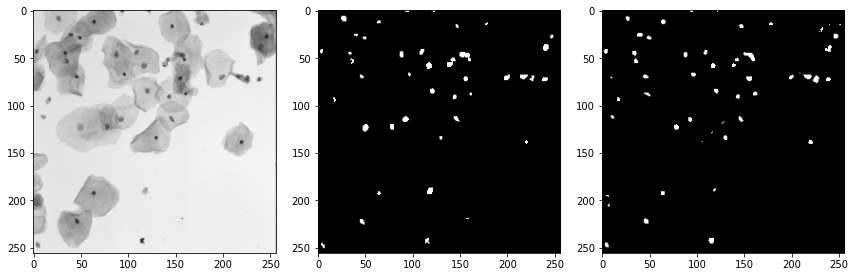

50a7ea80dd73232a17f98b5c83f62ec89989e892fe25b79b36f99b3872a7d182
0.9574554


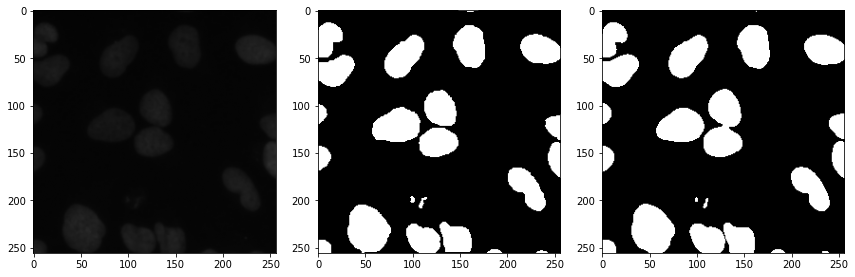

337b6eed0726f07531cd467cd62b6676c31a8c9e716bdbc49433986c022252cf
0.8283908


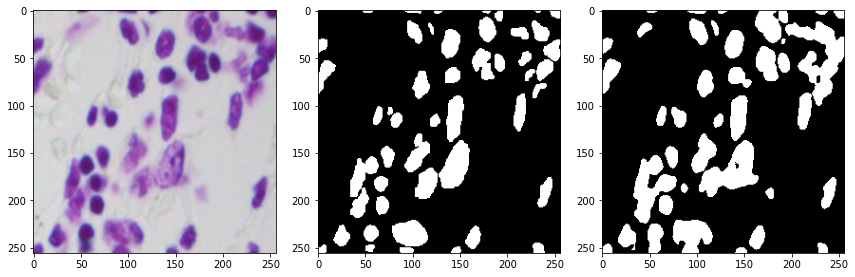

04acab7636c4cf61d288a5962f15fa456b7bde31a021e5deedfbf51288e4001e
0.84615755


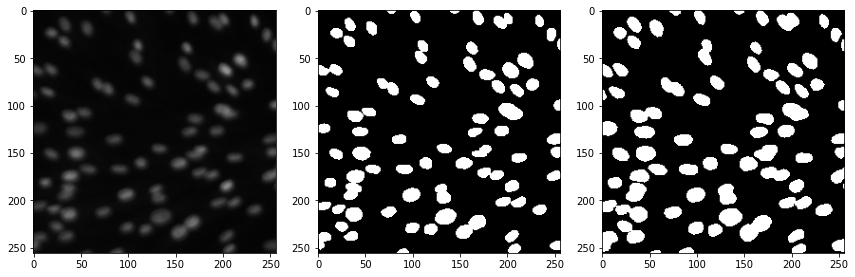

8e8a7a14749d0b2e48de3d10e2e80063f17b165ad921c8afc0623f08500f3259
0.8205453


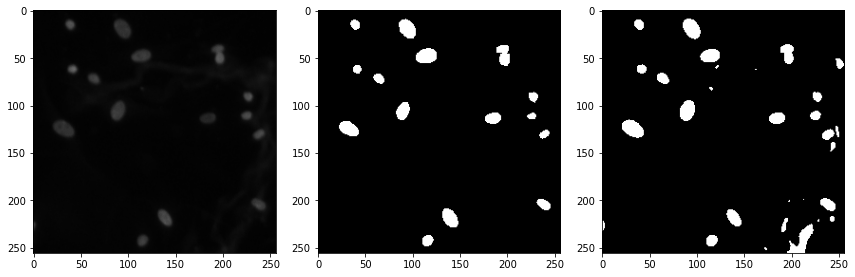

f952cc65376009cfad8249e53b9b2c0daaa3553e897096337d143c625c2df886
0.707296


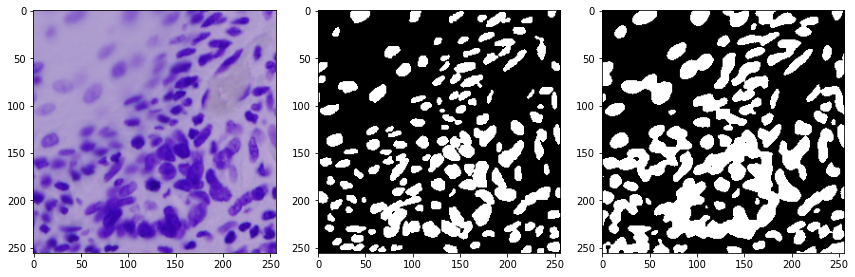

In [ ]:
#image, ground truth, prediction
visualize_outputs(sample_train_ids, unet_1, 'train')

0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac
0.8287792


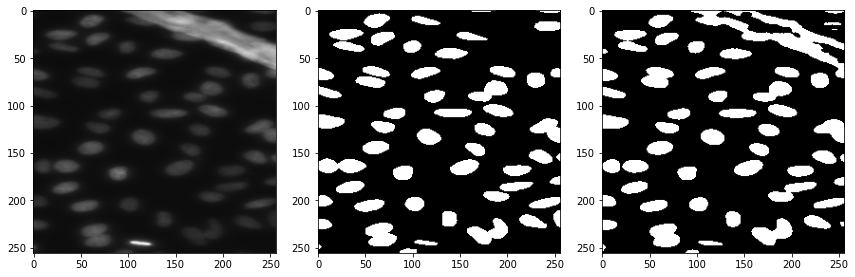

0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732
0.8783457


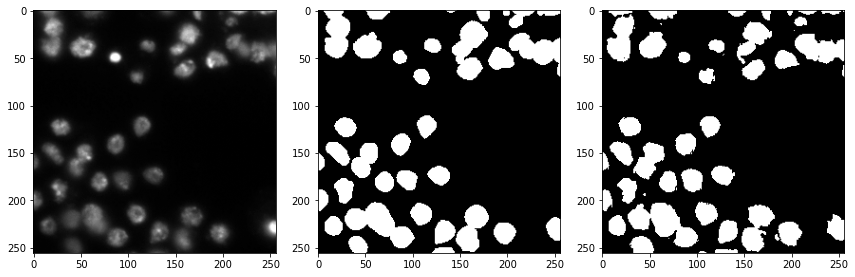

0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466
0.7836809


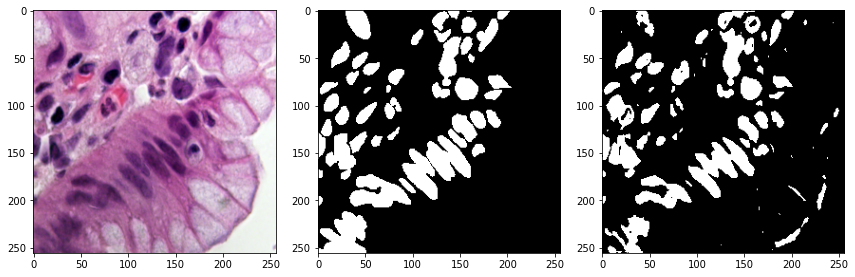

17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff
0.6819036


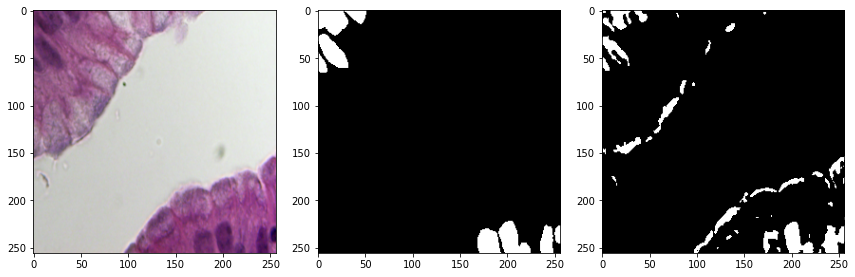

1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a
0.83927476


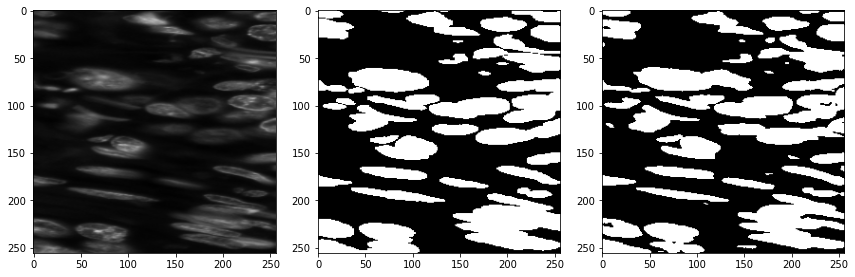

1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1
0.70824134


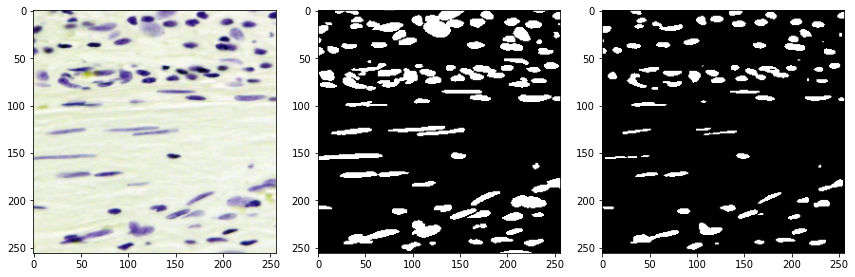

3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26
0.68180317


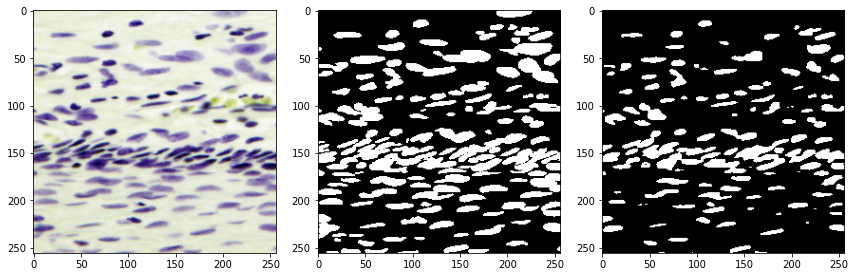

472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71
0.76997435


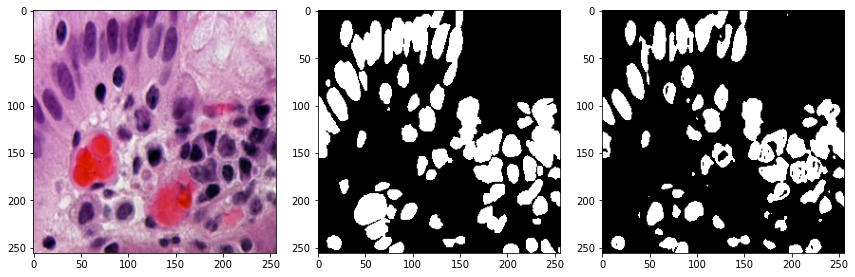

In [ ]:
visualize_outputs(sample_val_ids, unet_1, 'val')

dbd9dce0aed27ec69f7a47c8b715ad52e1dad472d82f9bf050470007dc1af94e


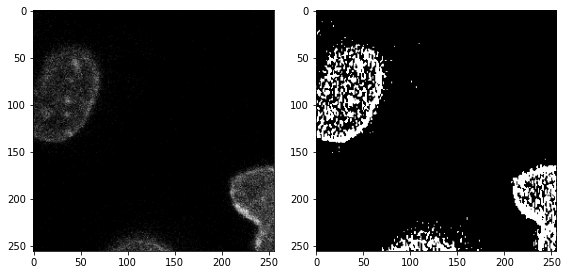

25ae6da0f1ced38fc87aff6fad90f9980062fa4d18161904364f5b95a20422a4


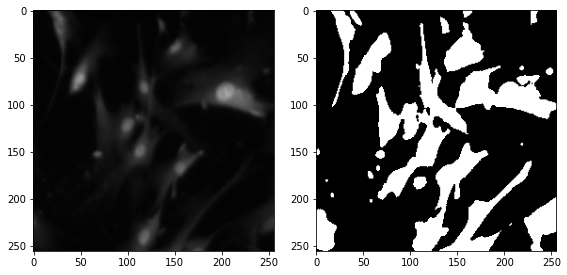

580fb557444d914797839fadecc9d6d60aa7c2eb98e854bafa014b3a13d27ddd


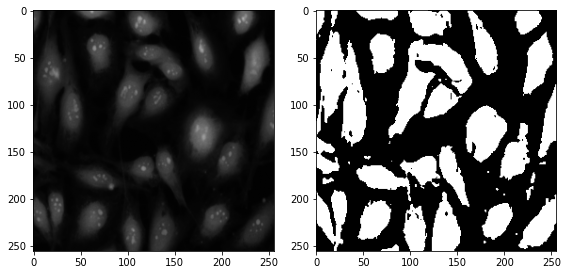

e0480625325c11f096d540a8cda158397095e0efa287fe7b0658477566ee48c8


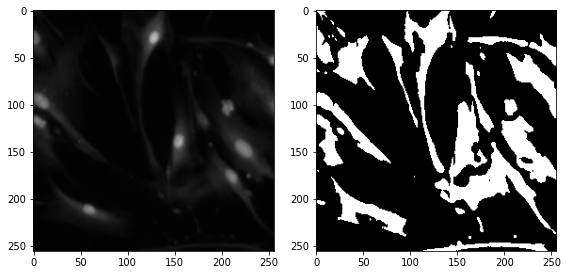

a7e5aa0e0b11c89f436dfebd2a1343739a69d065b3f78a0a11fdb65afd6f7457


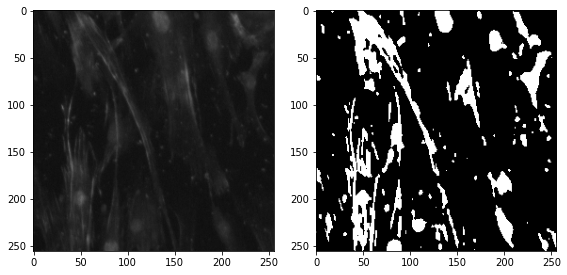

861a0fa08ceacdc6372728920d313a9b80257086e8e733e92d9c18c257ec9e93


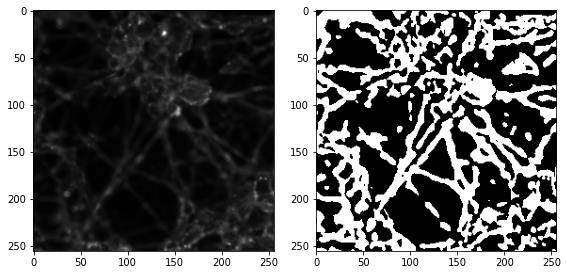

2fa8719a414b802474497eb5b3261f2e3903a75ec21534ffca674e1555072519


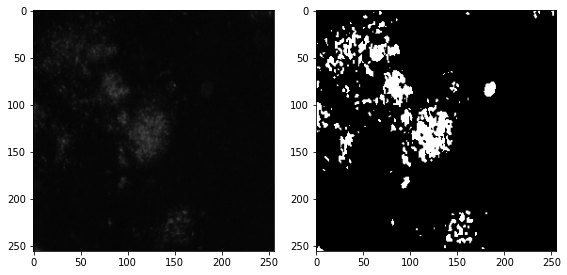

ce5176e721adba76663e9bdcc47c3ba0c70110573da99cf314a38d7eea070680


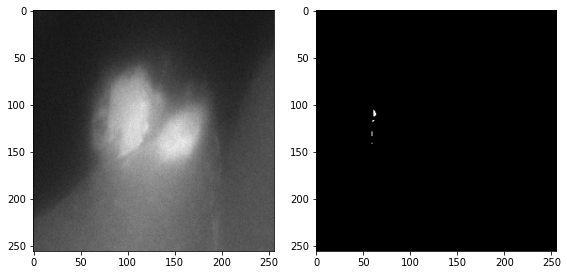

20d0d2ac8ecc95216d056b46163466a18b7f74c921e9f2b5e46e538a58de65e6


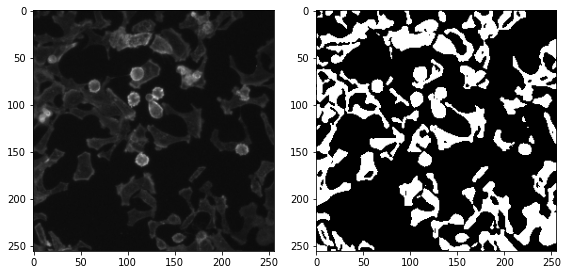

1028160a0e29d080fff27b2d8a119938fa8dbc86b1c88c3ea452b048191e1d79


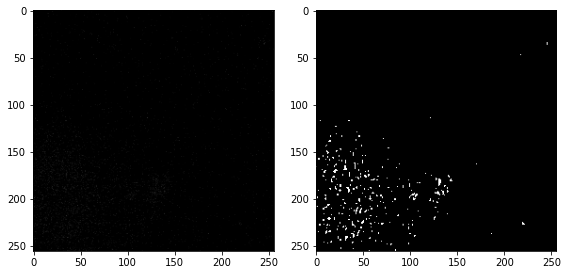

f3a512375cbe51d56efeb8a644923cf884eb23c06810f0218407c74225d83eab


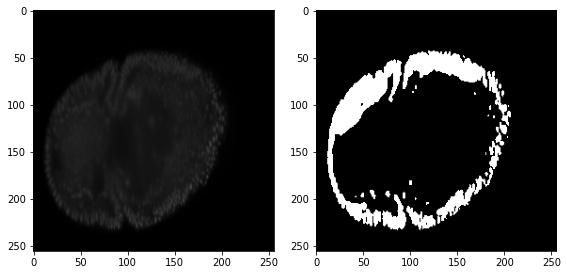

e90773e64b055d3ea09210c5f9803dba7126a717dc0baece319d2c9505e363c5


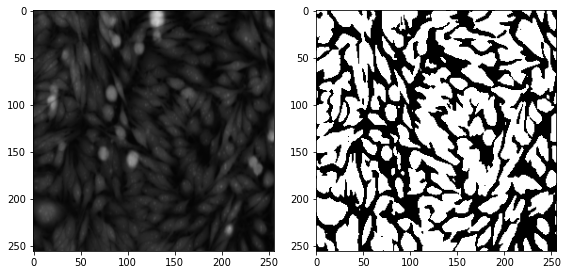

In [ ]:
visualize_outputs(sample_test_ids, unet_1, 'test')

## UNET2


In [ ]:
#Model Building

def get_unet_2(dropout_rate=0.1):
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  c1, e1 = encoder_block(inputs, 64, dropout_rate)
  c2, e2 = encoder_block(e1, 128, dropout_rate)
  c3, e3 = encoder_block(e2, 256, dropout_rate)
  c4, e4 = encoder_block(e3, 512, dropout_rate)
  t = transition_block(e4, 1024, dropout_rate)
  d4 = decoder_block(t, c4, 512, dropout_rate)
  d3 = decoder_block(d4, c3, 256, dropout_rate)
  d2 = decoder_block(d3, c2, 128, dropout_rate)
  d1 = decoder_block(d2, c1, 64, dropout_rate)
  outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(d1)
  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  return model

model = get_unet_2(dropout_rate=0.1)
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_256 (Conv2D)             (None, 256, 256, 64) 1792        input_7[0][0]                    
__________________________________________________________________________________________________
dropout_60 (Dropout)            (None, 256, 256, 64) 0           conv2d_256[0][0]                 
__________________________________________________________________________________________________
conv2d_257 (Conv2D)             (None, 256, 256, 64) 36928       dropout_60[0][0]                 
____________________________________________________________________________________________

In [ ]:
%tensorboard --logdir logs/

In [ ]:
EPOCHS = 1000
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

#get model 
model = get_unet_2(dropout_rate=0.3)

#Compiling
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True) #run_eagerly=True as this enables eager execution
                                                                                                        #and allows tensors to get converted to numpy
                                                                                                        #used in the custom metric mean_iou
#Defining Callbacks
log_dir = 'logs/' + 'unet_2'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=2)
checkpointer = tf.keras.callbacks.ModelCheckpoint('models/unet_2.h5', monitor='val_mean_iou_batch', mode='max', verbose=1, save_best_only=True)

#Training
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,  
                          callbacks=[tensorboard_callback, checkpointer, earlystopper],
                          verbose=1, )

Epoch 1/1000
41/41 [==============================] - 25s 585ms/step - loss: 5.5168 - mean_iou_batch: 0.4253 - val_loss: 0.5398 - val_mean_iou_batch: 0.4220

Epoch 00001: val_mean_iou_batch improved from -inf to 0.42195, saving model to models/unet_2.h5
Epoch 2/1000
41/41 [==============================] - 24s 574ms/step - loss: 0.3470 - mean_iou_batch: 0.4322 - val_loss: 0.2830 - val_mean_iou_batch: 0.4220

Epoch 00002: val_mean_iou_batch did not improve from 0.42195
Epoch 3/1000
41/41 [==============================] - 23s 572ms/step - loss: 0.2442 - mean_iou_batch: 0.4480 - val_loss: 0.2567 - val_mean_iou_batch: 0.5436

Epoch 00003: val_mean_iou_batch improved from 0.42195 to 0.54361, saving model to models/unet_2.h5
Epoch 4/1000
41/41 [==============================] - 23s 573ms/step - loss: 0.1862 - mean_iou_batch: 0.6263 - val_loss: 0.2283 - val_mean_iou_batch: 0.7277

Epoch 00004: val_mean_iou_batch improved from 0.54361 to 0.72767, saving model to models/unet_2.h5
Epoch 5/1000


In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}
unet_2 = tf.keras.models.load_model('models/unet_2.h5', custom_objects=dependencies)
unet_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

#Evaluation
print('val score:', unet_2.evaluate(val_dataset, steps=VALIDATION_STEPS))
print('train score:', unet_2.evaluate(train_dataset, steps=STEPS_PER_EPOCH))

4/4 [==============================] - 1s 216ms/step - loss: 0.1500 - mean_iou_batch: 0.8314
val score: [0.14998161792755127, 0.8314290046691895]
41/41 [==============================] - 10s 221ms/step - loss: 0.0689 - mean_iou_batch: 0.8995
train score: [0.06893475353717804, 0.8994667530059814]


In [ ]:
print('crosschecking val score:', custom_evaluate(unet_2, val_dataset, VALIDATION_STEPS))

crosschecking val score: 0.8314290025955013


In [ ]:
_ = tf.keras.utils.plot_model(unet_2, 'model_images/unet_2.png', show_shapes=True)

## UNET3


In [ ]:
def decoder_block_v2(input_decoder, skip_input, num_filters, dropout_=0.1):
  u = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_decoder)
  skip_input = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(skip_input)
  skip_input = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(skip_input)
  skip_input = tf.keras.layers.Dropout(dropout_)(skip_input)
  skip_input = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(skip_input)
  u = tf.keras.layers.concatenate([u, skip_input])
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u)
  c = tf.keras.layers.Dropout(dropout_)(c)
  c = tf.keras.layers.Conv2D(num_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c)
  return c

In [ ]:
#Model Building
def get_unet_3(dropout_rate=0.1):
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  c1, e1 = encoder_block(inputs, 64, dropout_rate)
  c2, e2 = encoder_block(e1, 128, dropout_rate)
  c3, e3 = encoder_block(e2, 256, dropout_rate)
  # c4, e4 = encoder_block(e3, 512, dropout_rate)
  t = transition_block(e3, 512, dropout_rate)
  # d4 = decoder_block_v2(t, c4, 512, dropout_rate)
  d3 = decoder_block_v2(t, c3, 256, dropout_rate)
  d2 = decoder_block_v2(d3, c2, 128, dropout_rate)
  d1 = decoder_block_v2(d2, c1, 64, dropout_rate)
  outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(d1)
  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  return model

unet_3 = get_unet_3(dropout_rate=0.1)
unet_3.summary() 

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       dropout[0][0]                    
______________________________________________________________________________________________

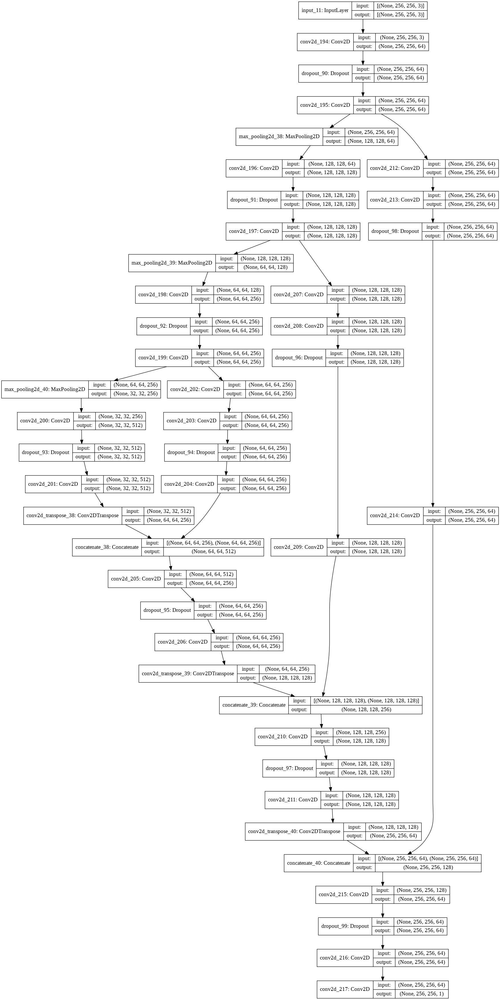

In [ ]:
tf.keras.utils.plot_model(unet_3, 'model_images/unet_3.png', show_shapes=True)

In [ ]:
%tensorboard --logdir logs/

In [ ]:
EPOCHS = 1000
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

#get model 
model = get_unet_3(dropout_rate=0.4)

#Compiling
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True) #run_eagerly=True as this enables eager execution
                                                                                                        #and allows tensors to get converted to numpy
                                                                                                        #used in the custom metric mean_iou
#Defining Callbacks
log_dir = 'logs/' + 'unet_3'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=2)
checkpointer = tf.keras.callbacks.ModelCheckpoint('models/unet_3.h5', monitor='val_mean_iou_batch', mode='max', verbose=1, save_best_only=True)

#Training
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,  
                          callbacks=[tensorboard_callback, checkpointer, earlystopper],
                          verbose=1, )

Epoch 1/1000
41/41 [==============================] - 37s 743ms/step - loss: 0.4096 - mean_iou_batch: 0.4247 - val_loss: 0.2724 - val_mean_iou_batch: 0.4220

Epoch 00001: val_mean_iou_batch improved from -inf to 0.42195, saving model to models/unet_3.h5
Epoch 2/1000
41/41 [==============================] - 30s 729ms/step - loss: 0.2356 - mean_iou_batch: 0.4299 - val_loss: 0.2722 - val_mean_iou_batch: 0.4220

Epoch 00002: val_mean_iou_batch did not improve from 0.42195
Epoch 3/1000
41/41 [==============================] - 30s 730ms/step - loss: 0.1925 - mean_iou_batch: 0.5302 - val_loss: 0.2424 - val_mean_iou_batch: 0.6728

Epoch 00003: val_mean_iou_batch improved from 0.42195 to 0.67282, saving model to models/unet_3.h5
Epoch 4/1000
41/41 [==============================] - 30s 732ms/step - loss: 0.1498 - mean_iou_batch: 0.7955 - val_loss: 0.3178 - val_mean_iou_batch: 0.6860

Epoch 00004: val_mean_iou_batch improved from 0.67282 to 0.68600, saving model to models/unet_3.h5
Epoch 5/1000


In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}
unet_3 = tf.keras.models.load_model('models/unet_3.h5', custom_objects=dependencies)
unet_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

#Evaluation
print('val score:', unet_3.evaluate(val_dataset, steps=VALIDATION_STEPS))
print('train score:', unet_3.evaluate(train_dataset, steps=STEPS_PER_EPOCH))

4/4 [==============================] - 1s 258ms/step - loss: 0.1259 - mean_iou_batch: 0.8432
val score: [0.12592557072639465, 0.8431540131568909]
41/41 [==============================] - 11s 260ms/step - loss: 0.0613 - mean_iou_batch: 0.9037
train score: [0.06129089742898941, 0.9037148952484131]


In [ ]:
print('crosschecking val score:', custom_evaluate(unet_3, val_dataset, VALIDATION_STEPS))

crosschecking val score: 0.8431540228908001


## HRNet


In [ ]:
def get_hrnet(dropout=0.1):
  #BASIC PARAMS
  base_filters = 16
  strides = (2,2)

  #MODEL ARCHITECTURE
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)) 

  #<--------------------LAYER1-------------------->
  #00
  b00 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
  b00 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b00)
  b00 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b00)
  b00 = tf.keras.layers.BatchNormalization()(b00)
  b00 = tf.keras.layers.Dropout(dropout)(b00)

  t000 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b00)
  t001 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b00)

  #<--------------------LAYER2-------------------->
  #01
  b01 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(t000)
  b01 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b01)
  b01 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b01)
  b01 = tf.keras.layers.BatchNormalization()(b01)
  b01 = tf.keras.layers.Dropout(dropout)(b01)

  t010 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b01)
  t011 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b01)
  t012 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b01)
  t012 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(t012)

  #11
  b11 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(t001)
  b11 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b11)
  b11 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b11)
  b11 = tf.keras.layers.BatchNormalization()(b11)
  b11 = tf.keras.layers.Dropout(dropout)(b11) 

  t110 = tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b11)
  t111 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b11)
  t112 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b11)

  #<--------------------LAYER3-------------------->
  #02
  b02 = tf.keras.layers.add([t010, t110])
  b02 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b02)
  b02 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b02)
  b02 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b02)
  b02 = tf.keras.layers.BatchNormalization()(b02)
  b02 = tf.keras.layers.Dropout(dropout)(b02)

  t020 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b02)
  t021 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b02)
  t022 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b02)
  t022 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(t022)
  t023 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b02)
  t023 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(t023)
  t023 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(t023)

  #12
  b12 = tf.keras.layers.add([t011, t111])
  b12 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b12)
  b12 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b12)
  b12 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b12)
  b12 = tf.keras.layers.BatchNormalization()(b12)
  b12 = tf.keras.layers.Dropout(dropout)(b12)

  t120 = tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b12)
  t121 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu' , kernel_initializer='he_normal', padding='same')(b12)
  t122 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b12)
  t123 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b12)
  t123 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(t123)

  #22
  b22 = tf.keras.layers.add([t012, t112])
  b22 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b22)
  b22 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b22)
  b22 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b22)
  b22 = tf.keras.layers.BatchNormalization()(b22)
  b22 = tf.keras.layers.Dropout(dropout)(b22)

  t220 = tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b22)
  t220 = tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(t220)
  t221 = tf.keras.layers.Conv2DTranspose(base_filters*2, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b22)
  t222 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b22)
  t223 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', strides=strides , kernel_initializer='he_normal', padding='same')(b22)

  #<--------------------LAYER4-------------------->
  #03
  b03 = tf.keras.layers.add([t020, t120, t220])
  b03 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b03)
  b03 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b03)
  b03 = tf.keras.layers.Conv2D(base_filters, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b03)
  b03 = tf.keras.layers.BatchNormalization()(b03)
  b03 = tf.keras.layers.Dropout(dropout)(b03)

  #13
  b13 = tf.keras.layers.add([t021, t121, t221])
  b13 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b13)
  b13 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b13)
  b13 = tf.keras.layers.Conv2D(base_filters*2, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b13)
  b13 = tf.keras.layers.BatchNormalization()(b13)
  b13 = tf.keras.layers.Dropout(dropout)(b13)

  #23
  b23 = tf.keras.layers.add([t022, t122, t222])
  b23 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b23)
  b23 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b23)
  b23 = tf.keras.layers.Conv2D(base_filters*4, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b23)
  b23 = tf.keras.layers.BatchNormalization()(b23)
  b23 = tf.keras.layers.Dropout(dropout)(b23)

  #33
  b33 = tf.keras.layers.add([t023, t123, t223])
  b33 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b33)
  b33 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b33)
  b33 = tf.keras.layers.Conv2D(base_filters*8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(b33)
  b33 = tf.keras.layers.BatchNormalization()(b33)
  b33 = tf.keras.layers.Dropout(dropout)(b33)

  #<--------------------LAYER5(CONCATENATION)-------------------->
  b13 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b13)

  b23 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b23)
  b23 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b23)

  b33 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b33)
  b33 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b33)
  b33 =  tf.keras.layers.Conv2DTranspose(base_filters, (2, 2), activation='relu', strides=strides, kernel_initializer='he_normal', padding='same')(b33)

  output = tf.keras.layers.concatenate([b03, b13, b23, b33])
  output = tf.keras.layers.Conv2D(1, (1, 1), kernel_initializer='he_normal', activation='sigmoid')(output)  

  model = tf.keras.Model(inputs=[inputs], outputs=[output])
  return model

model = get_hrnet()
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_152 (Conv2D)             (None, 256, 256, 16) 448         input_5[0][0]                    
__________________________________________________________________________________________________
conv2d_153 (Conv2D)             (None, 256, 256, 16) 2320        conv2d_152[0][0]                 
__________________________________________________________________________________________________
conv2d_154 (Conv2D)             (None, 256, 256, 16) 2320        conv2d_153[0][0]                 
____________________________________________________________________________________________

In [ ]:
%tensorboard --logdir logs/

In [ ]:
EPOCHS = 1000
STEPS_PER_EPOCH = len(TRAIN_IDS) // BATCH_SIZE
VALIDATION_STEPS = len(VAL_IDS) // BATCH_SIZE

#get model 
model = get_hrnet(dropout=0.2)

#Compiling
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True) #run_eagerly=True as this enables eager execution
                                                                                                        #and allows tensors to get converted to numpy
                                                                                                        #used in the custom metric mean_iou
#Defining Callbacks
log_dir = 'logs/' + 'hrnet'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, verbose=2)
checkpointer = tf.keras.callbacks.ModelCheckpoint('models/hrnet.h5', monitor='val_mean_iou_batch', mode='max', verbose=1, save_best_only=True)

#Training
model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_dataset,  
                          callbacks=[tensorboard_callback, checkpointer, earlystopper],
                          verbose=1, )

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/1000
41/41 [==============================] - 23s 530ms/step - loss: 0.2756 - mean_iou_batch: 0.6929 - val_loss: 1.3186 - val_mean_iou_batch: 0.1679

Epoch 00001: val_mean_iou_batch improved from -inf to 0.16787, saving model to models/hrnet.h5
Epoch 2/1000
41/41 [==============================] - 21s 516ms/step - loss: 0.1261 - mean_iou_batch: 0.8185 - val_loss: 3.1807 - val_mean_iou_batch: 0.1699

Epoch 00002: val_mean_iou_batch improved from 0.16787 to 0.16993, saving model to models/hrnet.h5
Epoch 3/1000
41/41 [==============================] - 21s 514ms/step - loss: 0.1277 - mean_iou_batch: 0.8128 - val_loss: 0.4870 - val_mean_iou_batch: 0.5676

Epoch 00003: val_mean_iou_batch improved from 0.16993 to 0.56762, saving model to models/hrnet.h5
Epoch 4/1000
41/41 [==============================] - 21s 515ms/step - loss: 0.0986 - mean_iou_batch: 0.8512 - val_loss: 0.2563 - val_mean_iou_batch: 0.7238

Epoch 00004: val_mean_iou_batch improved from 0.56762 to 0.72376, saving mode

In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}
hrnet = tf.keras.models.load_model('models/hrnet.h5', custom_objects=dependencies)
hrnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

#Evaluation
print('val score:', hrnet.evaluate(val_dataset, steps=VALIDATION_STEPS))
print('train score:', hrnet.evaluate(train_dataset, steps=STEPS_PER_EPOCH))

4/4 [==============================] - 1s 188ms/step - loss: 0.1258 - mean_iou_batch: 0.8497
val score: [0.12577806413173676, 0.8497031331062317]
41/41 [==============================] - 9s 196ms/step - loss: 0.0555 - mean_iou_batch: 0.9070
train score: [0.05550786852836609, 0.9070013761520386]


In [ ]:
print('crosschecking val score:', custom_evaluate(hrnet, val_dataset, VALIDATION_STEPS))

crosschecking val score: 0.8497030906344367


In [ ]:
_ = tf.keras.utils.plot_model(hrnet, 'model_images/hrnet.png', show_shapes=True)

# Compare all the models

In [ ]:
def compare_models(sample_ids, models, data='train', figsize=(12,6)):
  X = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  
  if data == 'train' or data == 'val':
    true_masks = np.zeros((len(sample_ids), IMG_HEIGHT, IMG_WIDTH, 1))
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, data), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      mask = resize(get_id_mask(id, data), (IMG_HEIGHT, IMG_WIDTH))
      #masks to binary
      mask = np.round(mask)
      X[ind] = img
      true_masks[ind] = mask[:,:,np.newaxis]
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+2, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      ax[1].imshow(true_masks[i][:,:,0], cmap='gray')
      ax[1].set_title('true mask')
      for m in range(len(models)):
        ax[m+2].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')
        ax[m+2].set_title(mean_iou_single(true_masks[i], pred_masks_list[m][i]))    
      fig.tight_layout()
      plt.show()

  if data == 'test':
    for ind, id in enumerate(sample_ids):
      img = resize(get_id_image(id, 'test'), (IMG_HEIGHT, IMG_WIDTH))[:,:,:IMG_CHANNELS]
      X[ind] = img
    pred_masks_list = []
    for modl in models:
      pred_masks_list.append(np.round(modl.predict(X)))
    for i in range(len(sample_ids)):
      print(sample_ids[i])
      fig, axes = plt.subplots(1, len(models)+1, figsize=figsize)
      ax = axes.ravel()
      ax[0].imshow(X[i])
      ax[0].set_title('image')
      for m in range(len(models)):
        ax[m+1].imshow(pred_masks_list[m][i][:,:,0], cmap='gray')   
      fig.tight_layout()
      plt.show()

**EVALUATION**

In [ ]:
#Loading the best model
dependencies = {'mean_iou_batch':mean_iou_batch}

unet_1 = tf.keras.models.load_model('models/unet_1.h5', custom_objects=dependencies)
unet_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

unet_2 = tf.keras.models.load_model('models/unet_2.h5', custom_objects=dependencies)
unet_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

unet_3 = tf.keras.models.load_model('models/unet_3.h5', custom_objects=dependencies)
unet_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

hrnet = tf.keras.models.load_model('models/hrnet.h5', custom_objects=dependencies)
hrnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou_batch], run_eagerly=True)

In [ ]:
#Evaluation
print('*'*50)
print('unet_1')
print('val score:', unet_1.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_1.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('unet_2')
print('val score:', unet_2.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_2.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('unet_3')
print('val score:', unet_3.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', unet_3.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

print('*'*50)
print('hrnet')
print('val score:', hrnet.evaluate(val_dataset, steps=VALIDATION_STEPS, verbose=0))
print('train score:', hrnet.evaluate(train_dataset, steps=STEPS_PER_EPOCH, verbose=0))

**************************************************
unet_1
val score: [0.10983511060476303, 0.8609639406204224]
train score: [0.057758912444114685, 0.9092418551445007]
**************************************************
unet_2
val score: [0.14998161792755127, 0.8314290046691895]
train score: [0.0690448209643364, 0.8985386490821838]
**************************************************
unet_3
val score: [0.12592557072639465, 0.8431540131568909]
train score: [0.061236441135406494, 0.9043474197387695]
**************************************************
hrnet
val score: [0.12577806413173676, 0.8497031331062317]
train score: [0.055391889065504074, 0.9070509076118469]


**MANUAL INSPECTION**

3594684b9ea0e16196f498815508f8d364d55fea2933a2e782122b6f00375d04


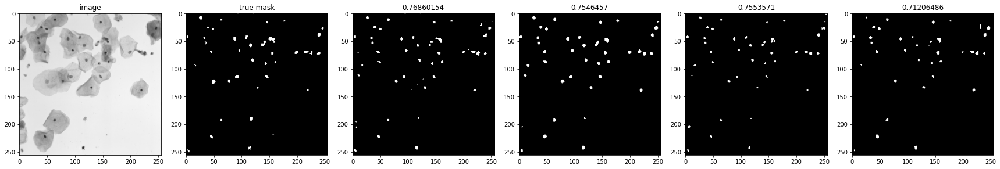

50a7ea80dd73232a17f98b5c83f62ec89989e892fe25b79b36f99b3872a7d182


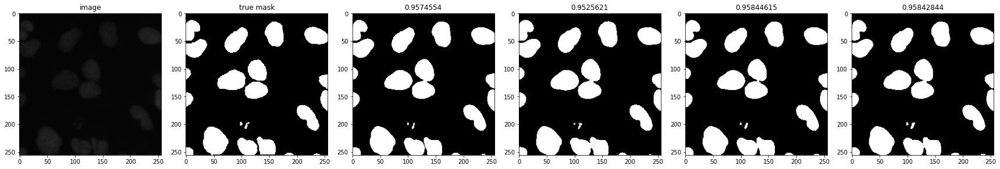

337b6eed0726f07531cd467cd62b6676c31a8c9e716bdbc49433986c022252cf


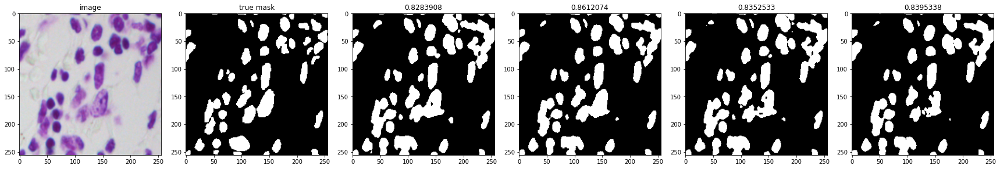

04acab7636c4cf61d288a5962f15fa456b7bde31a021e5deedfbf51288e4001e


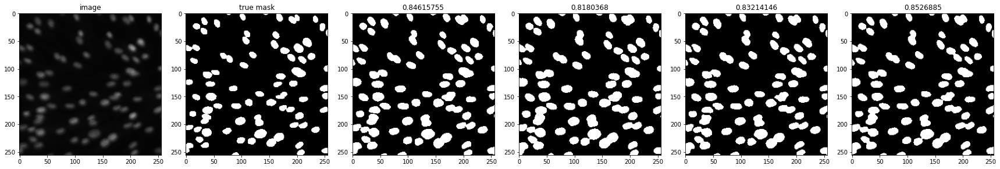

8e8a7a14749d0b2e48de3d10e2e80063f17b165ad921c8afc0623f08500f3259


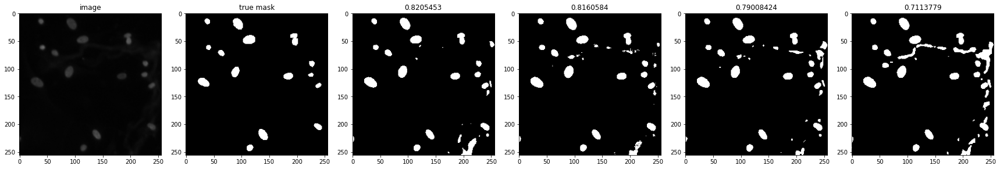

f952cc65376009cfad8249e53b9b2c0daaa3553e897096337d143c625c2df886


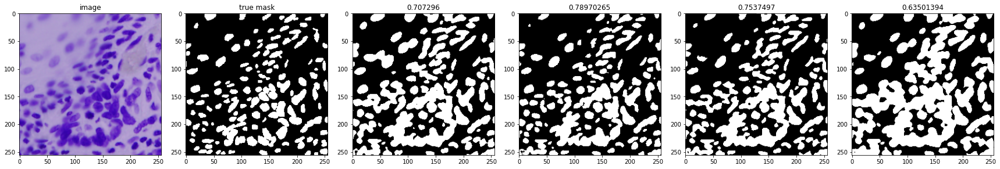

In [ ]:
compare_models(sample_train_ids, [unet_1, hrnet, unet_3, unet_2], 'train', (24,8))

0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac


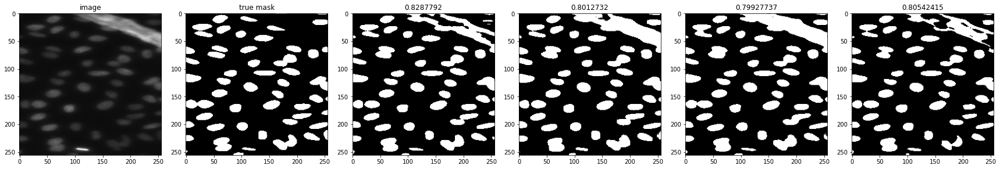

0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732


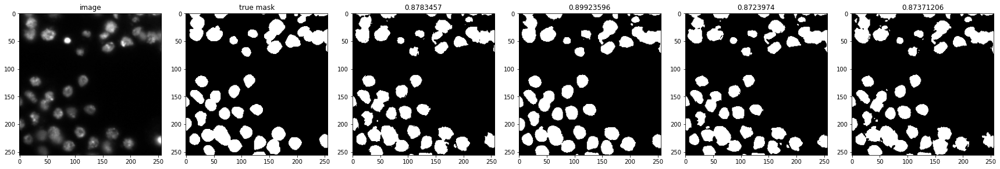

0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466


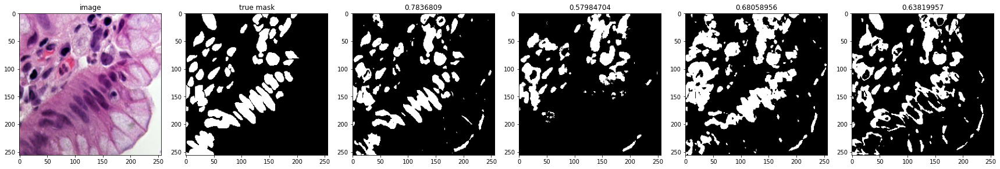

17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff


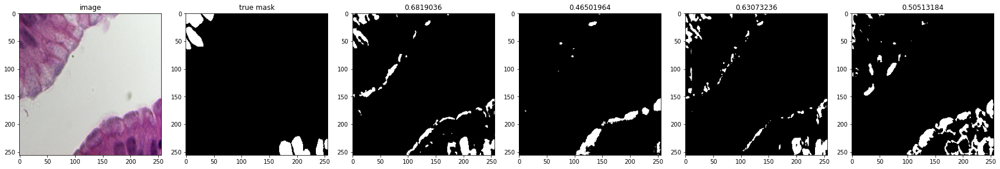

1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a


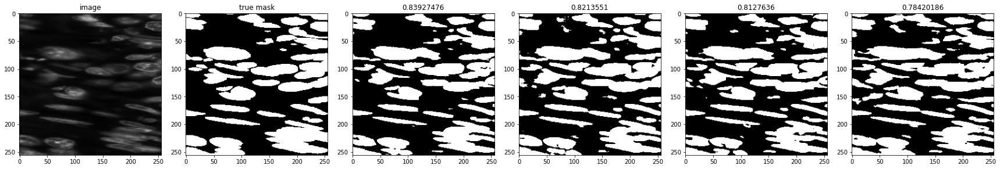

1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1


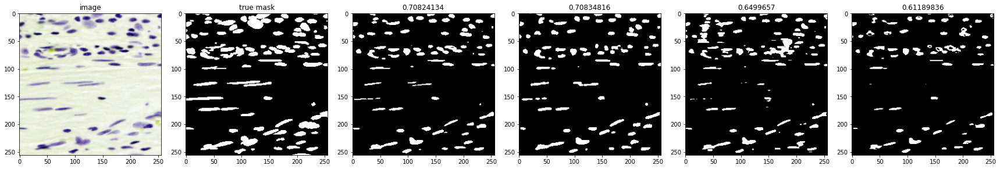

3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26


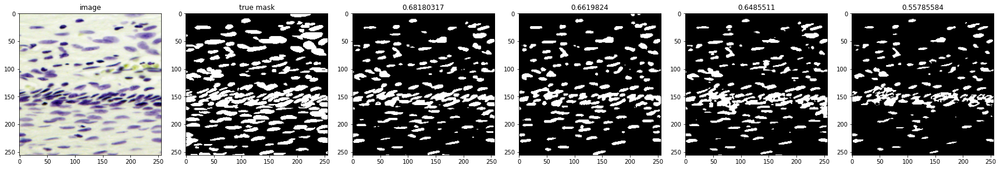

472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71


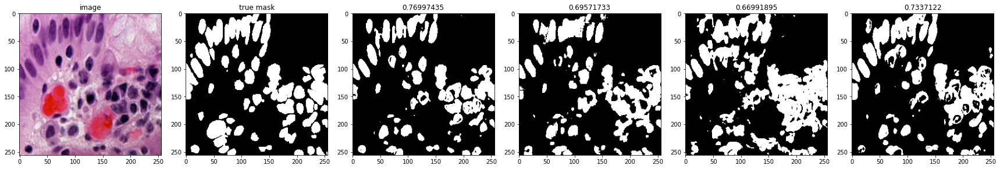

In [ ]:
compare_models(sample_val_ids, [unet_1, hrnet, unet_3, unet_2], 'val', (24,8))

In [ ]:
compare_models(sample_test_ids, [unet_1, hrnet, unet_3, unet_2], 'test', (24,8))